# Example of usage Spark OCR for Text Detection using ImageTextDetectorV2

This notebook demonstrate pipeline for detect text using __ImageTextDetectorV2__ on the image.

__ImageTextDetectorV2__ can work with CPU, but prefer to use GPU for have acceptable performance.

# Install and Start Spark OCR with Healthcare NLP

Define the variables from your license file before running this notebook.

> `spark_ocr_jar_path` is used internally for testing and should usually be ignored.

## Variables

```python
# Required variables from your license file:
# license = "..."
# secret = "..."          # Visual Product Secret
# nlp_secret = "..."      # Healthcare Product Secret
# public_version = "..."  # Open Source Version
# aws_access_key = "..."
# aws_secret_key = "..."
# spark_ocr_jar_path = None
```

## Install Visual NLP

```python
ocr_version = secret.split("-")[0]

!pip install --upgrade -q spark-ocr==$ocr_version \
  --extra-index-url=https://pypi.johnsnowlabs.com/$secret \
  --upgrade
```

## Install Healthcare NLP

```python
jsl_version = nlp_secret.split("-")[0]

!pip -q install --upgrade spark-nlp-jsl==$jsl_version \
  --extra-index-url https://pypi.johnsnowlabs.com/$nlp_secret
```

## Install Open-Source Spark NLP and PySpark

Check your license file for the correct open-source Spark NLP version.

```python
public_version = "6.4.2"
!pip install --upgrade -q pyspark==3.4.0 spark-nlp==$public_version
```

## Install Java 8

```python
!apt-get update
!apt-get install -y openjdk-8-jdk
```

<div style="color: red; font-size: 28px; font-weight: bold;">
⚠️ WARNING: RESTART YOUR SESSION AFTER INSTALLING JSL COMPONENTS.
</div>

## Start Spark OCR

```python
from sparkocr import start
import os
from pyspark import SparkConf

if license:
    os.environ["JSL_OCR_LICENSE"] = license
    os.environ["SPARK_NLP_LICENSE"] = license

if aws_access_key:
    os.environ["AWS_ACCESS_KEY"] = aws_access_key
    os.environ["AWS_SECRET_ACCESS_KEY"] = aws_secret_key

# nlp_internal is the Healthcare NLP version.
# Use this when running Visual NLP with Healthcare NLP.

# When starting a Visual NLP session, it needs either secret/jar_path
spark = start(
    secret=secret,
    nlp_secret=nlp_secret,
    jar_path=spark_ocr_jar_path,
    use_gpu=True,
    nlp_internal="6.4.1"
)

spark
```

In [1]:
secret = ""
license = ""
AWS_ACCESS_KEY_ID = ""
AWS_SECRET_ACCESS_KEY = ""

version = secret.split("-")[0]
spark_ocr_jar_path = "../../../target/scala-2.11/"

In [ ]:
# install from PYPI using secret
#%pip install torch
#%pip install spark-ocr==$version --extra-index-url=https://pypi.johnsnowlabs.com/$secret --upgrade

## Initialization of spark session

In [ ]:
from sparkocr import start

spark = start(secret=secret, jar_path = spark_ocr_jar_path)

spark

# Read image and display it

In [3]:
import pkg_resources
import pyspark.sql.functions as f
from pyspark.ml import PipelineModel
from sparkocr.transformers import *
from sparkocr.enums import *
from sparkocr.utils import display_images


    Image #0:
    Origin: file:/Users/nmelnik/.local/share/virtualenvs/OcrMissedPages-W3gpzUuJ/lib/python3.7/site-packages/sparkocr/resources/ocr/images/check.jpg
    Resolution: 199 dpi
    Width: 582 px
    Height: 744 px
    Mode: ImageType.TYPE_3BYTE_BGR
    Number of channels: 3


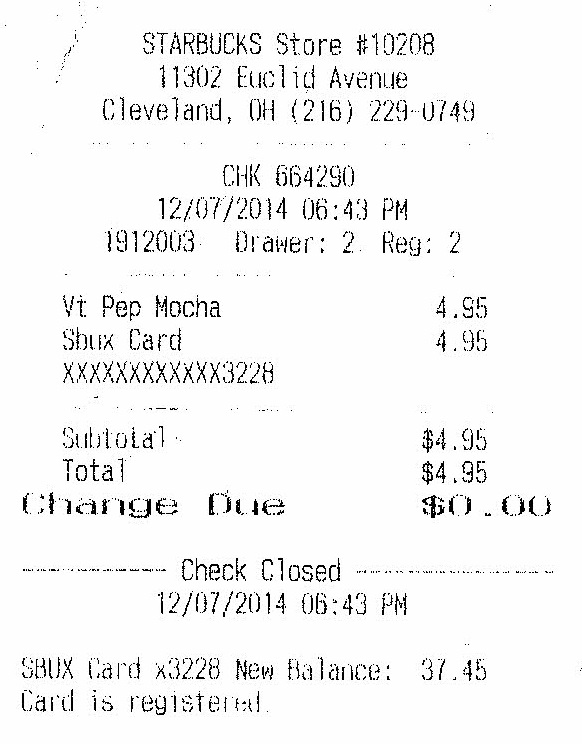


    Image #1:
    Origin: file:/Users/nmelnik/.local/share/virtualenvs/OcrMissedPages-W3gpzUuJ/lib/python3.7/site-packages/sparkocr/resources/ocr/text_detection/020_Yas_patella1.jpg
    Resolution: 72 dpi
    Width: 1512 px
    Height: 2016 px
    Mode: ImageType.TYPE_3BYTE_BGR
    Number of channels: 3


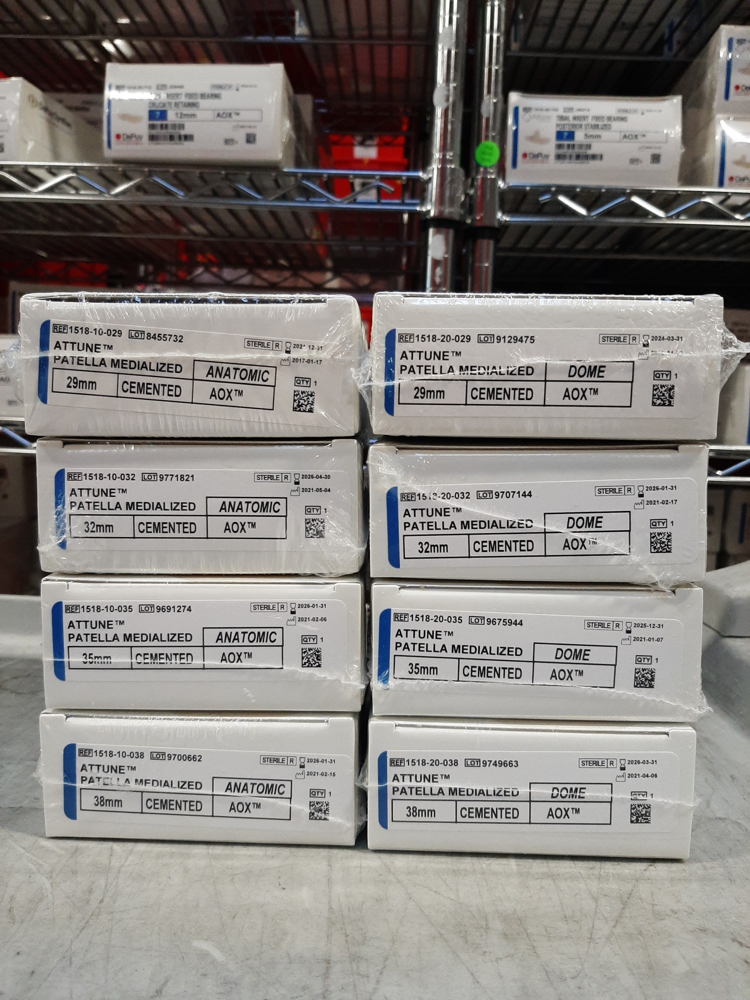

In [4]:
imagePath1 = pkg_resources.resource_filename('sparkocr', 'resources/ocr/text_detection/020_Yas_patella1.jpg')
imagePath2 = pkg_resources.resource_filename('sparkocr', 'resources/ocr/images/check.jpg')
image_df = spark.read.format("binaryFile").load([imagePath1, imagePath2]).sort("path")

display_images(BinaryToImage().setImageType(ImageType.TYPE_3BYTE_BGR).transform(image_df), "image")

# Define OCR Pipeline for detect and recognize text 

In [5]:
binary_to_image = BinaryToImage() 
binary_to_image.setImageType(ImageType.TYPE_3BYTE_BGR)

text_detector = ImageTextDetectorV2 \
    .pretrained("image_text_detector_v2", "en", "clinical/ocr") \
    .setInputCol("image") \
    .setOutputCol("text_regions") \
    .setScoreThreshold(0.5) \
    .setTextThreshold(0.2) \
    .setSizeThreshold(10) \
    .setWithRefiner(True)

draw_regions = ImageDrawRegions() \
    .setInputCol("image") \
    .setInputRegionsCol("text_regions") \
    .setOutputCol("image_with_regions") \
    .setRectColor(Color.green)

pipeline = PipelineModel(stages=[
    binary_to_image,
    text_detector,
    draw_regions
])

image_text_detector_v2 download started this may take some time.
Approximate size to download 75.3 MB


# Run pipeline and show results


    Image #0:
    Origin: file:/Users/nmelnik/.local/share/virtualenvs/OcrMissedPages-W3gpzUuJ/lib/python3.7/site-packages/sparkocr/resources/ocr/images/check.jpg
    Resolution: 0 dpi
    Width: 582 px
    Height: 744 px
    Mode: ImageType.TYPE_3BYTE_BGR
    Number of channels: 3


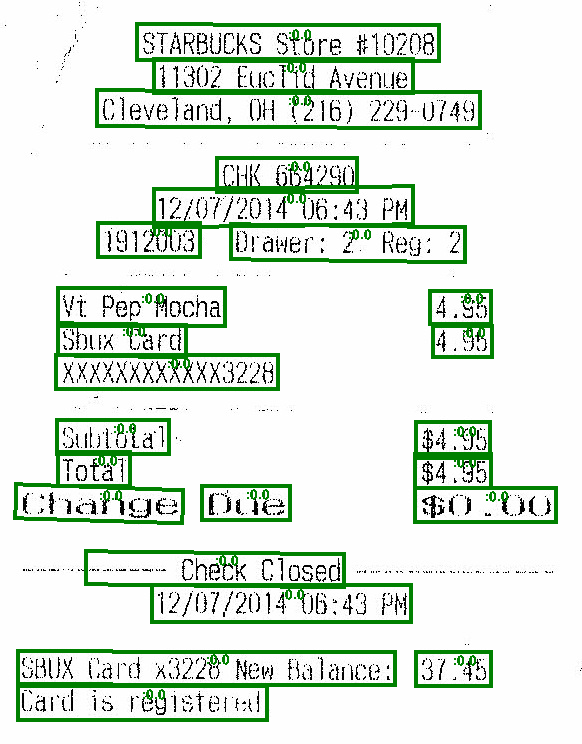


    Image #1:
    Origin: file:/Users/nmelnik/.local/share/virtualenvs/OcrMissedPages-W3gpzUuJ/lib/python3.7/site-packages/sparkocr/resources/ocr/text_detection/020_Yas_patella1.jpg
    Resolution: 0 dpi
    Width: 1512 px
    Height: 2016 px
    Mode: ImageType.TYPE_3BYTE_BGR
    Number of channels: 3


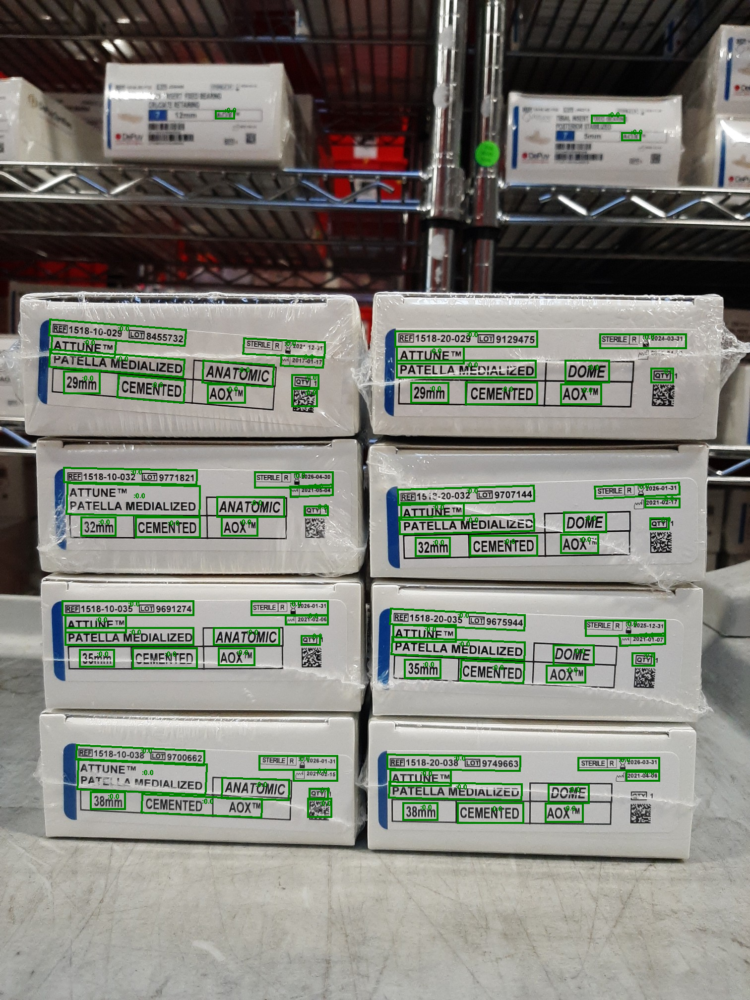

In [6]:
result = pipeline.transform(image_df)
display_images(result, "image_with_regions")

## Disable refiner and tune thresholds for detect each word separately


    Image #0:
    Origin: file:/Users/nmelnik/.local/share/virtualenvs/OcrMissedPages-W3gpzUuJ/lib/python3.7/site-packages/sparkocr/resources/ocr/images/check.jpg
    Resolution: 0 dpi
    Width: 582 px
    Height: 744 px
    Mode: ImageType.TYPE_3BYTE_BGR
    Number of channels: 3


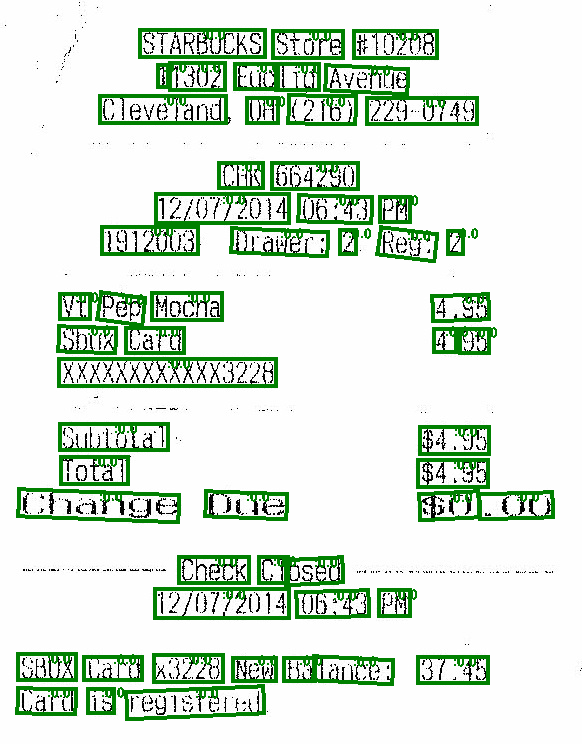


    Image #1:
    Origin: file:/Users/nmelnik/.local/share/virtualenvs/OcrMissedPages-W3gpzUuJ/lib/python3.7/site-packages/sparkocr/resources/ocr/text_detection/020_Yas_patella1.jpg
    Resolution: 0 dpi
    Width: 1512 px
    Height: 2016 px
    Mode: ImageType.TYPE_3BYTE_BGR
    Number of channels: 3


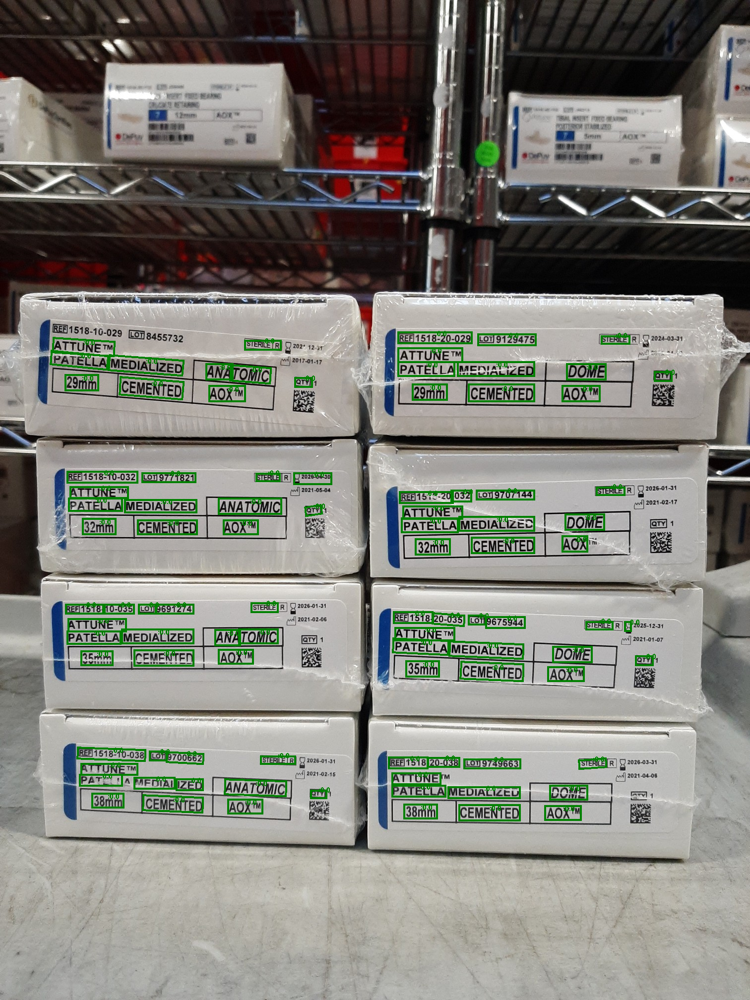

In [7]:
pipeline.stages[1].setWithRefiner(False)
pipeline.stages[1].setSizeThreshold(15)
pipeline.stages[1].setLinkThreshold(0.3)
pipeline.stages[1].setScoreThreshold(0.7)
pipeline.stages[1].setTextThreshold(0.4)
pipeline.stages[1].setMergeIntersects(False)

result = pipeline.transform(image_df)
display_images(result, "image_with_regions")

## Enable merging intersects of bounding boxes in same line

In [ ]:
pipeline.stages[1].setMergeIntersects(True)

result = pipeline.transform(image_df)
display_images(result, "image_with_regions")